# <a href="https://mipt-stats.gitlab.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 6. Линейная регрессия.


**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds22_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*

**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком *или*
    * вставив ее в ноутбук посредством `Edit -> Insert Image`;
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). <font color="red"><b>Неправильно вставленные фотографии могут не передаться при отправке.</b></font> Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* В решениях поясняйте, чем вы пользуетесь, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.

**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 40 баллов
* Задача 2 &mdash; 70 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 50 баллов
* Задача 4 &mdash; 50 баллов
* Задача 5 &mdash; 30 балла


In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn import metrics

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1.

Рассмотрим одномерную линейную регрессию без свободного параметра $y(x) = \theta x$, где $x\in \mathbb{R}$ и $\theta \in \mathbb{R}$. Предполагаем, что данные получены по правилу
$$Y_i = \theta x_i + \varepsilon_i,$$
где $i \in \{1, ..., n\}$, числа $x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i$ &mdash; случайные ошибки.

**1.** Посчитайте оценку $\widehat{\theta}$ методом наименьших квадратов.

**2.** Выпишите формулы градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$.

**3.** Пусть $\mathsf{E}\varepsilon_i = 0$, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{E}\widehat{\theta}$ и $\mathsf{E}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$.

**4.** Пусть $\mathsf{E}\varepsilon_i = 0$ и $\mathsf{D}\varepsilon_i = \sigma^2$, причем все $\varepsilon_i$ независимы, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{D}\widehat{\theta}$ и $\mathsf{D}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$.



*Замечания.* 
1. В ответе во всех пунктах могут оставаться суммы $n$ слагаемых, но не должно быть операций с векторами или матрицами.
2. Формулами мат. ожидания и дисперсии с занятия пользоваться нельзя, но стоит сверить ответ.
2. **Прочитай требования к формату решения в правилах сдачи задания.**

Вопрос 1. $\newline$
Посчитаем $\widehat{\theta}$ с помощю МНК. По МНК $\widehat{\theta}$ = $(X^T\cdot X)^{-1}\cdot X^T\cdot Y$. X и Y в нашем случае это просто вектора. Тогда $(X^T\cdot X)^{-1} = (X; X)^{-1} = (\sum_{i = 1}^{n} x_i^2)^{-1}$. А $X^T\cdot Y = \sum_{i = 1}^{n} x_i\cdot y_i$. Тогда  $\widehat{\theta} = (\sum_{i = 1}^{n} x_i^2)^{-1}\cdot \sum_{i = 1}^{n} x_i\cdot y_i$.

Вопрос 2 $\newline$
 По формуле из лекции $\widehat{\theta}_{t + 1} = \widehat{\theta}_{t} - \eta\cdot X^T\cdot(X\cdot\widehat{\theta}_{t} - Y)$.
 В предыдущем пункте мы свели матричное умножение к суммам воспользуясь полученным материалом имеем. $\widehat{\theta}_{t + 1} = \widehat{\theta}_{t} - \eta\cdot(\sum_{i = 1}^{n} x_i^2 - \sum_{i = 1}^{n} x_i\cdot y_i)$.
 Для стахестического спуска $\widehat{\theta}_{t + 1} = \widehat{\theta}_{t} - \eta\cdot n\cdot (x_i^2 - x_i\cdot y_i)$

Вопрос 3 $\newline$
$\mathsf{E}\widehat{\theta} = \mathsf{E}((\sum_{i = 1}^{n} x_i^2)^{-1}\cdot \sum_{i = 1}^{n} x_i\cdot y_i) = 
(\sum_{i = 1}^{n} x_i^2)^{-1}\cdot\sum_{i = 1}^{n} x_i\cdot \mathsf{E}(y_i) =\theta $. Теперь посчитаем $\mathsf{E}\widehat{y}(x)$. $\mathsf{E}\widehat{y}(x) = x \cdot \mathsf{E}\widehat{\theta} = x \cdot\theta$ По свойствам мат ожидания.

Вопрос 4$\newline$
$\mathsf{D}\widehat{\theta} = \mathsf{D}((\sum_{i = 1}^{n} x_i^2)^{-1}\cdot \sum_{i = 1}^{n} x_i\cdot y_i) = 
(\sum_{i = 1}^{n} x_i^2)^{-2}\cdot\sum_{i = 1}^{n} x_i^2\cdot \mathsf{D}(y_i) = (\sum_{i = 1}^{n} x_i^2)^{-2}\cdot\sum_{i = 1}^{n} x_i^2\cdot\sigma^2 = \sigma ^2\cdot(\sum_{i = 1}^{n} x_i^2)^{-1}$. Теперь посчитаем $\mathsf{D}\widehat{y}(x)$. $\mathsf{D}\widehat{y}(x) = x^2 \cdot \mathsf{D}\widehat{\theta}$ По свойствам дисперсии

---
### Задача 2.

Скоро лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.

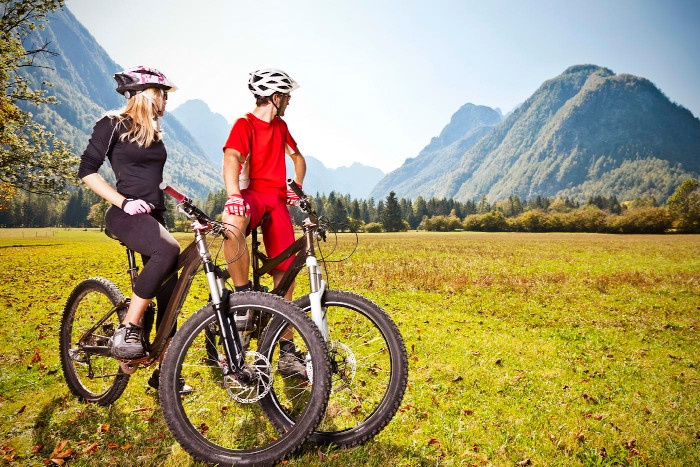

Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; весна, 2 &mdash; лето, 3 &mdash; осень, 4 &mdash; зима;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

Перед выполнением задания обязательно посмотрите <a href="https://mipt-stats.gitlab.io/courses/ad_fivt/linreg_sklearn.html">ноутбук</a> с занятия по линейной регрессии.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [38]:
data_frame = pd.read_csv("day.csv")
data_frame = data_frame[["season", "mnth", "holiday", "weekday", "workingday", "weathersit", "temp", "atemp", "hum", "windspeed", "cnt"]]

In [39]:
data_frame.shape

(731, 11)

Разобьем на тестовые и обучающие данные

In [40]:
train, test = train_test_split(data_frame, test_size=0.2, random_state =37372114)
print(train.shape, test.shape)

(584, 11) (147, 11)


#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. 

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

In [41]:
real_feat = ["mnth", "temp", "atemp", "hum", "windspeed", "weekday"] #Я знаю что формально mnth категориальный но 12 категорий это много поэтому так
categori_feat = ["season", "holiday", "workingday", "weathersit"]
target_feat = "cnt"

C:\Users\serge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
C:\Users\serge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
C:\Users\serge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
C:\Users\serge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
C:\Users\serge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
C:\Users\serge\AppData\Local\Programs\Py

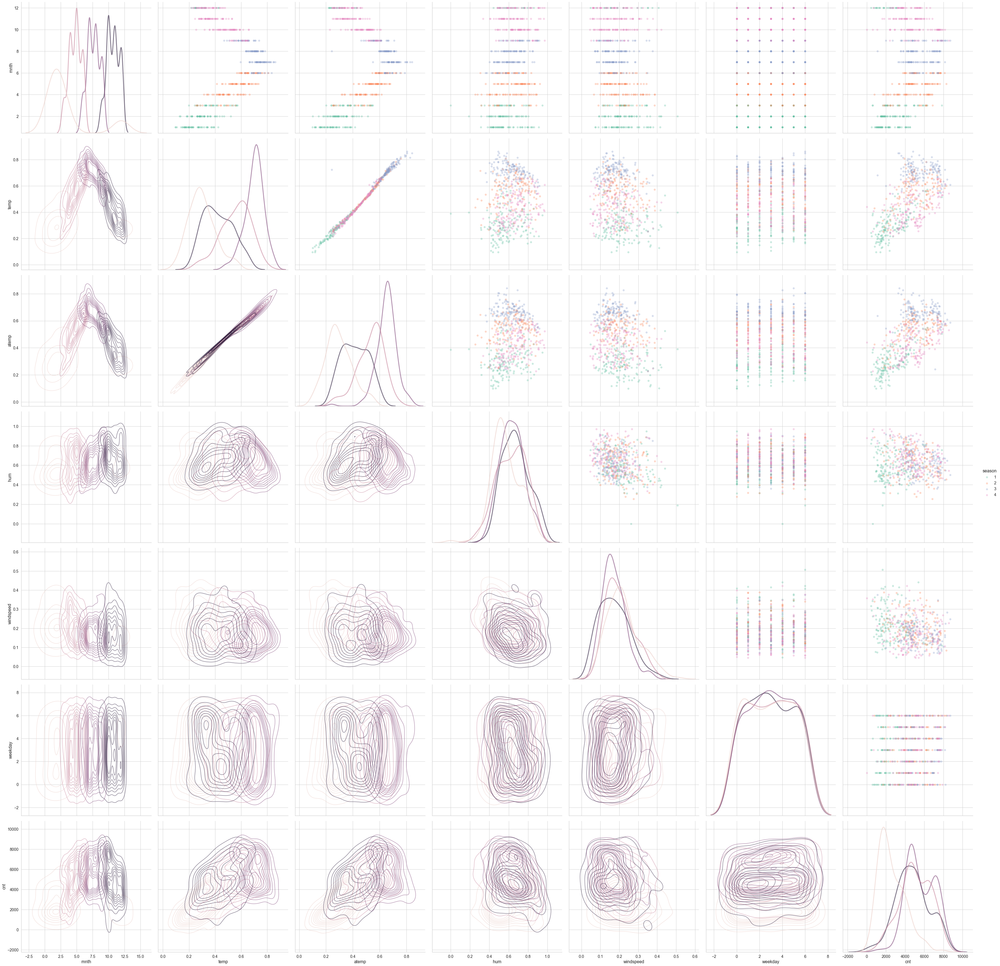

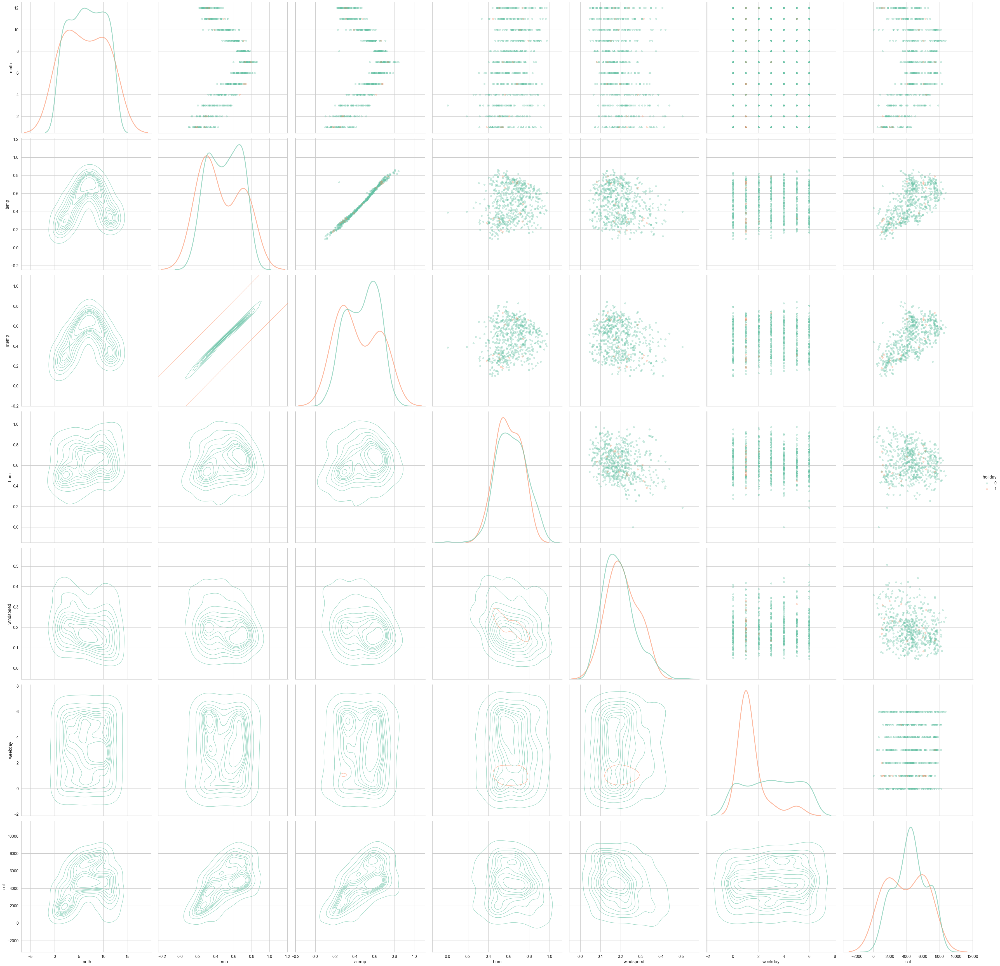

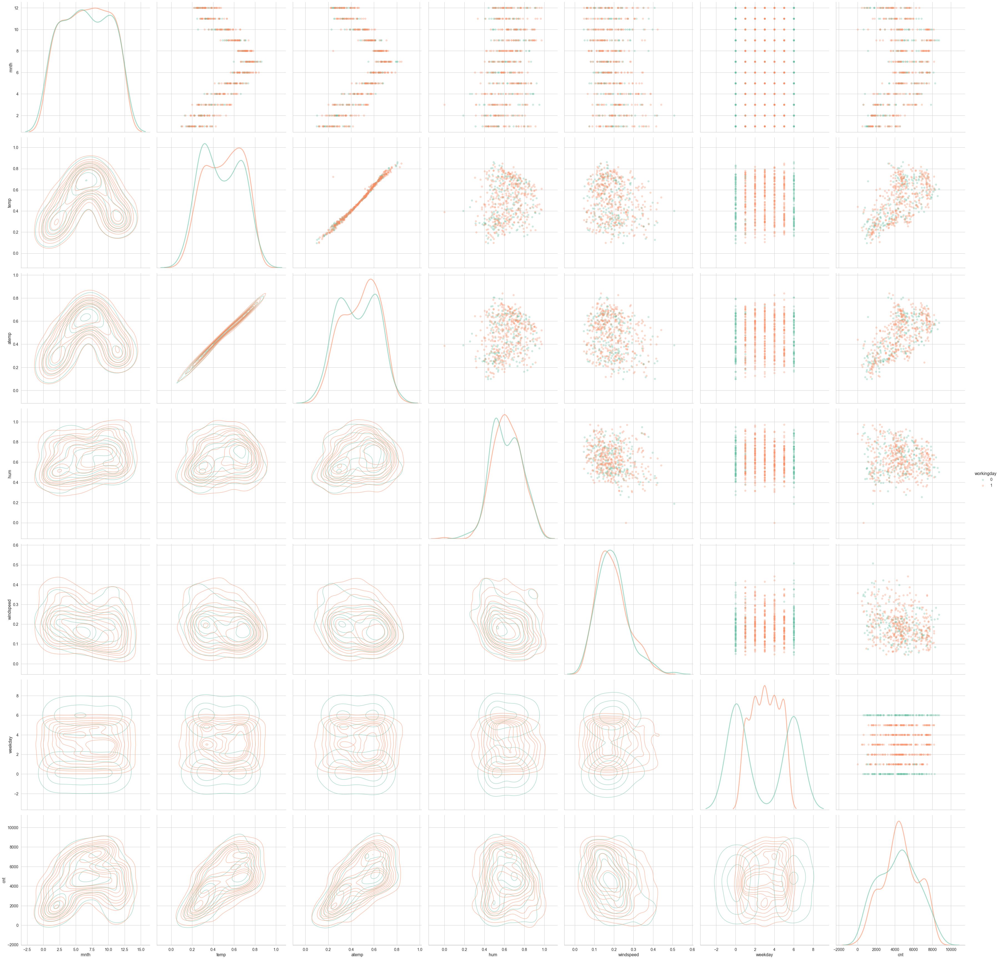

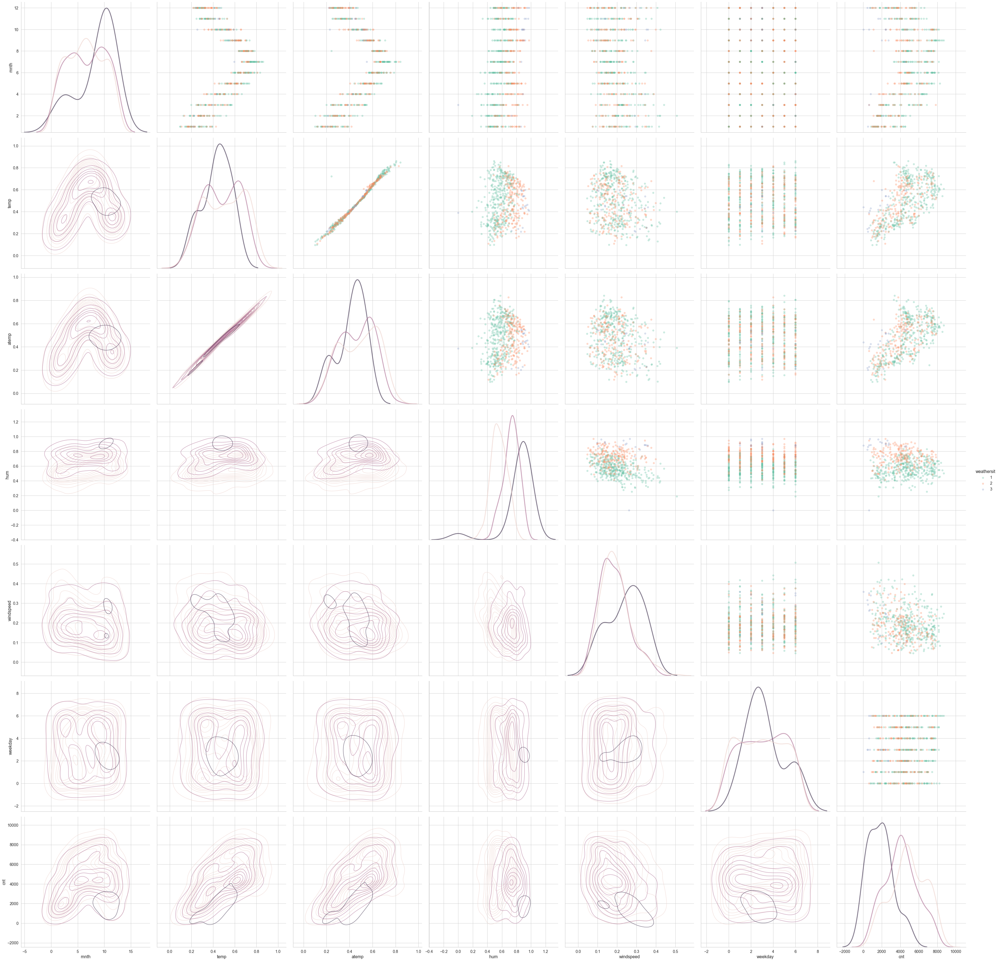

In [42]:
for hue in categori_feat:
    g = sns.PairGrid(train[[*real_feat, target_feat, hue]], 
                     hue=hue, diag_sharey=False, height=7)
    
    g.map_lower(sns.kdeplot, alpha=0.6)
    g.map_upper(plt.scatter, alpha=0.3)
    g.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)
    
    g.add_legend()

Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.



**Выводы по графикам:**

Сильнее всего количесвто велосипедов в прокате зависит от температуры. Зависимость похожа на линейную. Еще есть зависимость от месяца. зависимость похожа на квадратичную. Но зависимость месяца от продаж очень похожа с зависимостью месяца от температуры. Нам не нужен месяц в квадрате мы его предскажем по температуре. Существенных выбросов практически нет. Удалять что-либо смылса не вижу.

Так же из рассмотрения нужно убрать либо температуру либо температуру по ощущениям так как они линейно зависимы. 

#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, что-то еще.

**Процедура предобработки данных:**

**1.**  Преобразуем категориальные признаки в бинарные

In [43]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categori_feat])

Удолим atemp из рассмотрения


In [44]:
del real_feat[2]
#del real_feat[0]
real_feat

['mnth', 'temp', 'hum', 'windspeed', 'weekday']

Сольем результаты в один np.array

In [45]:
X_train = np.hstack([train[real_feat], train_cat])

#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов.

In [46]:
class MNK:
    fit_intercept = True
    def __init__(self, lambd=0, fit_intercept=True): 
        self.lambd = lambd
        self.fit_intercept = fit_intercept
        
        
    def fit(self, X, Y):
        x_high, x_len = X.shape
        self.E_x = np.mean(X, axis = 0)
        self.D_x = np.var(X, axis = 0)
        X = (X - self.E_x)/(self.D_x)**0.5
        if (self.fit_intercept):
            X = np.concatenate((np.ones(x_high).reshape((x_high, 1)), X), axis=1)
        self.tetta = np.linalg.inv(self.lambd * np.eye(x_len + 1) + X.T @ X) @ X.T @ Y
        
    def coef_(self):
        return self.tetta
    def predict(self, X):
        x_high, x_len = X.shape
        X = (X - self.E_x)/(self.D_x)**0.5
        if (self.fit_intercept):
            X = np.concatenate((np.ones(x_high).reshape((x_high, 1)), X), axis=1)
        return X @ self.tetta

In [47]:
model = MNK(fit_intercept=True)  # объявляем модель
model.fit(X_train, train[target_feat])  # обучаем

In [48]:
model.coef_()

array([4512.81506849,  -50.4309447 , 1096.68041289, -321.21674887,
       -284.44415658,  132.69574857,  396.27417197,  236.30623956,
        716.1864313 ,  -16.66732624,   41.01505778, -156.87295668,
       -362.73832252])

Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать, но в то же время выбросы вносят существенный вклад в значение метрики. 

In [49]:
# Кодируем категориальные признаки с помощью метода transform обученного ранее кодировщика
test_cat = encoder.transform(test[categori_feat])

# Соединяем данные
X_test = np.hstack([test[real_feat], test_cat])

In [50]:
test_preds = model.predict(X_test)

MSE Метрика

In [51]:
metrics.mean_squared_error(test[target_feat], test_preds) ** 0.5

1324.4988896432344

MAE Метрика

In [52]:
metrics.mean_absolute_error(test[target_feat], test_preds)

1153.129441516847

MAPE метрика

In [53]:
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()
mean_absolute_percentage_error(test[target_feat], test_preds)

36.438552436278854

Не плохо. Хотя достаточно не ожиданно. Я просмотрел зависимость между количесвтом велосипедов и скоростью ветра и влажностью. Пресмотревшись еще раз я их так и не увидел. Ну ладно.

Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками.

Я это учел все линейно зависимые величины я убрал.

Хотя, кажеться что индекс погоды очень сильно зависит от температуры влажности и скорости ветра. Давайте попробуем обучить модель без этого признака.

In [54]:
del categori_feat[-1]
categori_feat

['season', 'holiday', 'workingday']

Далее копипаста обучения

In [56]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categori_feat])
X_train = np.hstack([train[real_feat], train_cat])
model = MNK(fit_intercept=True)  # объявляем модель
model.fit(X_train, train[target_feat])  # обучаем

Посмотрим на получившиеся коэффициенты

In [58]:
model.coef_()

array([4512.81506849,  -50.91926143, 1162.07067905, -522.83669897,
       -361.16476451,  113.72012762,  395.76353452,  206.00998071,
        697.28882908,  -13.5299246 ,   24.98061826])

Построим предсказание

In [59]:
# Кодируем категориальные признаки с помощью метода transform обученного ранее кодировщика
test_cat = encoder.transform(test[categori_feat])

# Соединяем данные
X_test = np.hstack([test[real_feat], test_cat])
test_preds = model.predict(X_test)

Посчитаем различные метрики

In [60]:
print(metrics.mean_squared_error(test[target_feat], test_preds) ** 0.5, "- MSE")
print(metrics.mean_absolute_error(test[target_feat], test_preds), "- MAE")
print(mean_absolute_percentage_error(test[target_feat], test_preds), "- MAPE")

1328.3793925489356 - MSE
1146.6752708945041 - MAE
35.875747928890476 - MAPE


Примерно такое-же качество. Значит все же коэффициент погоды не зависил линейно от наших параметров. Ну ладно.

Сделайте выводы.

**Выводы:**

*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

Как и ожидалось сильнее всего влияет погода на прокат тоесть температура влажность и скорость ветра. Мы построили модель которая совершает 36% ошибок. Чтож не так уж и плохо на лекции модель работала намного хуже. 

### <font color="orange"><i>Сложная часть</i></font>

### Задача 3.

Как можно было увидеть ранее, оценки коэффициентов становятся слишком большими при наличии некоторых проблем с данными. Чтобы этого не происходило, часто выполняют процедуру *регуляризации* в модели. 

Пусть $X \in \mathbb{R}^{n \times d}$ &mdash; матрица признаков, $Y \in \mathbb{R}^{n}$ &mdash; вектор значений целевого признака, $\theta \in \mathbb{R}^{d}$ &mdash; неизвестный вектор параметров. В методе наименьших квадратов решается задача
$$\| Y - X\theta \|^2 \longrightarrow \min_\theta.$$
Регуляризация заключается в искусственном усечении значений вектора оценок коэффициентов путем добавления его нормы к оптимизируемому функционалу. Тем самым решается задача
$$\| Y - X\theta \|^2 + \lambda \| \theta \|^2 \longrightarrow \min_\theta,$$
где $\lambda > 0$ &mdash; гиперпараметр модели, то есть число, которое задается пользователем. Такая модель называется **Ridge-регрессией**.

**1.** Найдите оценку $\theta$ в модели ridge-регрессии. Сравните ее с оценкой коэффициентов в методе наименьших квадратов. Помогает ли она избавиться от проблемы обратимости матрицы в МНК, которая обсуждалась на занятии?

Найдем $\nabla \| Y - X\theta \|^2 + \lambda \| \theta \|^2 = \nabla (Y^TY-2Y^T\theta X + X^T\theta^T\theta X) + \lambda \nabla\theta^T\theta = 2\lambda\theta - 2X^TY + 2\cdot X^TX\theta \Rightarrow \widehat{\theta} = (\lambda E +X^TX)^{-1}X^TY$

Ну чтож посчитаем дисперсию и матожидание для одномерного случая так как эта формула покажет нам минусы и плюсы данного подхода однако сократит выкладки. $\mathsf{E}\widehat{\theta} = \mathsf{E}((\lambda E +X^TX)^{-1}X^TY) = (\lambda E +X^TX)^{-1}X^T\mathsf{E}Y = (\lambda E +X^TX)^{-1}X^T\theta X$. ПРи стремлении $\lambda$ к 0. Действительно матожидание от $\widehat{\theta}$  это $\theta$ но тогда мы утратим эффект не вырожденности матрицы. Теперь рассмотрим случай $X^TX << 1$. Хорошо тогда разложив по Тейлору имеем. $\mathsf{E}\widehat{\theta} = \lambda^{-1}\cdot\theta(1-X^2)\cdot X^2$. То есть если нам повезло подобрать $\lambda$ порядка $X^{2}$ то мы по порядку велечины угадаем $\theta$. Для чего нам этот метод для меня до сих пор загадка. Дисперсию считать особого смысла нет так как у нас среднее не совпадает с действительным и информация об отклонении нам мало что даст.

Хотя так как $X^2$ величина по большому счету фиксированная на обучающих данных мы можем выбором $\lambda$ очень хорошо оценить $\widehat{\theta}$. Действительно если $\lambda = X^2$ то  $\mathsf{E}\widehat{\theta} = \theta$. Я вычитал на Хабре что эта штука уменьшает дисперсию. Проверять я это не буду ,но верю в это. Однако вопрос с распределениями с двумя и более параметрами остаеться открытым. Правда всеравно так как лямбда порядка квалрата малой велечины метод не работает. Чтобы он работал Лямбда должна быть большой. Но в таком случаек Мат ожидание тетта очень сильно сжимаеться к нулю. С таким же успехом можно было поделить на очень маленькую константу все данные мы бы уменьшили дисперсию и сжали бы матожидание. Чем этот способ лучше я не понимаю(.

**2.** Выпишите формулу поиска оценки коэффициентов методом *градиентного спуска* и *стохастического градиентного спуска* для модели ridge-регрессии. Не забудьте указать, как получается батч.

Так как $\nabla \| Y - X\theta \|^2 + \lambda \| \theta \|^2 = (\lambda E +X^TX)^{-1}X^TY$. То  $\widehat{\theta}_{t + 1} = \widehat{\theta}_{t} - \eta\cdot(\lambda E +X^TX)^{-1}X^TY$.
 Для стахестического спуска $\widehat{\theta}_{t + 1} = \widehat{\theta}_{t} - \eta\cdot n\cdot (x_i^2 - x_i\cdot y_i)$ Так как прибавление еденичной матрицы почти ничего не меняет.

**3.** Многие модели машинного обучения требуют *стандартизацию признаков*. Существует множество различных способов стандартизации, из которых наиболее распространены два следующих.
1. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html"><it>StandardScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ &mdash; выборочное среднее значение признака $j$ (функция `np.mean`), а $s^2_j$ &mdash; выборочную дисперсию признака $j$ (функция `np.var`). Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{s_j}.$$
2. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html"><it>MinMaxScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ и $M_j$ &mdash; минимальное и максимальное значения признака $j$ соответственно. Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{M_j - m_j}.$$

Для метода наименьших квадратов стандартизацию признаков можно не производить, однако для модели ridge-регрессии стандартизация необходима. Поясните это. Можно представить, что признаки имеют некоторые различные единицы измерения.

По правде говоря объяснить это достаточно сложно. Данный метод не разбирался на лекции на вопрос об его обосновании мне сказали что дадут его потом. Однако попробую предположить что именно таким способом мы достигаем не критичности ограничения на $\theta$. 
То есть если бы у нас была совсем произвольная модель то большие $\theta$ могли там встречаться как что-то естественное. Но после применения такой процедуры мы считаем что таких $\theta$ быть не должно.

### Задача 4.

В данной задаче мы продолжим анализировать данные велопроката из задачи 2.

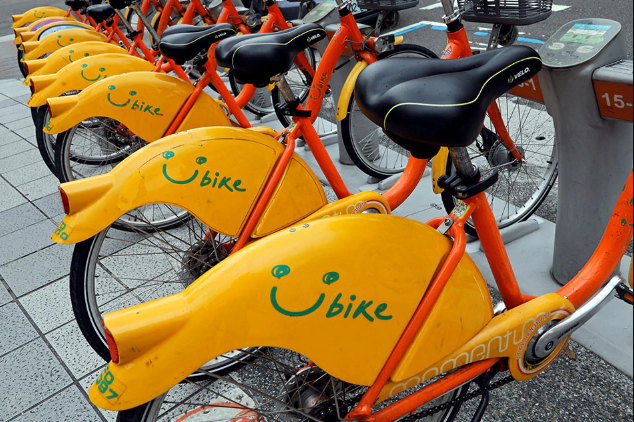

Для начала реализуйте класс для работы с моделью ridge-регрессии. Интерфейс этого класса соответствует стандарту библиотеки `sklearn`, который использует также множество других библиотек.

Предподсчитаем также мат ожидание и дисперсию по каждому из признаков. И стандартизируем их перед отправкой в формулу.

In [11]:
class RidgeRegression:
    fit_intercept = True
    def __init__(self, lambd=0.1, fit_intercept=True): 
        self.lambd = lambd
        self.fit_intercept = fit_intercept
        
        
    def fit(self, X, Y):
        x_high, x_len = X.shape
        self.E_x = np.mean(X, axis = 0)
        self.D_x = np.var(X, axis = 0)
        X = (X - self.E_x)/(self.D_x)**0.5
        if (self.fit_intercept):
            X = np.concatenate((np.ones(x_high).reshape((x_high, 1)), X), axis=1)
        self.tetta = np.linalg.inv(self.lambd * np.eye(x_len + 1) + X.T @ X) @ X.T @ Y
        
    def coef_(self):
        return self.tetta
    def predict(self, X):
        x_high, x_len = X.shape
        X = (X - self.E_x)/(self.D_x)**0.5
        if (self.fit_intercept):
            X = np.concatenate((np.ones(x_high).reshape((x_high, 1)), X), axis=1)
        return X @ self.tetta

Разделите данные на три части &mdash; обучающую, валидационную и тестовую в соотношении 3:1:1. На первой из них вам необходимо проводить всю аналитику и обучать все модели &mdash; регрессию, скалирование и т.д.. Вторую вы будете использовать для выбора оптимального значения гиперпараметра. Наконец, тестовую выборку необходимо использовать только для вычисления итогового значения метрик выбранной модели. Именно эти числа вам нужно говорить заказчику.

In [176]:
df = pd.read_csv('day.csv')
train, valid =  train_test_split(df, test_size=0.4, random_state =37372114)
valid, test = train_test_split(valid, test_size=0.5, random_state =37372114)
print("train size", train.shape[0], "\n valid size", valid.shape[0],  "\n test size ", test.shape[0], end='')

train size 438 
 valid size 146 
 test size  147

Выполните необходимые преобразования признаков. Не забудьте, что обучить преобразования нужно только по обучающей выборке. Учтите все особенности, которые обсуждались ранее.

Зададим действительные и категориальные признаки.

In [177]:
real_feat = ['mnth', 'temp', 'hum', 'windspeed', 'weekday']
categori_feat = ["season", "holiday", "workingday", "weathersit"]
target_feat = "cnt"

Переведем категорильные признаки в бинарные и сольем нашу табличку в одну.

In [178]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categori_feat])
X_train = np.hstack([train[real_feat], train_cat])

Определите сетку значений гиперпараметра $\lambda$ и обучите для каждого значения сетки модель ridge-регрессии. Обычно эффективнее брать сетку в логарифмическом масштабе.

In [179]:
lambd1 = [2**i for i in range(-50, 50)]

Для каждой из них посчитайте ошибку по метрикам RMSE, MAE, MAPE по обучающей и валидационной выборкам. 

Сначало подготовим valid

In [180]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
valid_cat = encoder.fit_transform(valid[categori_feat])
X_valid = np.hstack([valid[real_feat], valid_cat])

In [181]:
RMSE_train = []
RMSE_valid = []
MAE_train = []
MAE_valid = []
MAPE_train = []
MAPE_valid = []
model_list = []
model_params = []
for i in lambd1:
    model = RidgeRegression(lambd=i)
    model.fit(X_train, train[target_feat])
    model_list += [model]
    model_params += [model.coef_()]
    RMSE_train += [metrics.mean_squared_error(train[target_feat], model.predict(X_train)) ** 0.5]
    RMSE_valid += [metrics.mean_squared_error(valid[target_feat], model.predict(X_valid)) ** 0.5]
    MAE_train += [metrics.mean_absolute_error(train[target_feat], model.predict(X_train))]
    MAE_valid += [metrics.mean_absolute_error(valid[target_feat], model.predict(X_valid))]
    MAPE_train += [mean_absolute_percentage_error(train[target_feat], model.predict(X_train))]
    MAPE_valid += [mean_absolute_percentage_error(valid[target_feat], model.predict(X_valid))]

Для каждой метрики постройте графики зависимости значений метрики от значения гиперпараметра. Сравните поведение значений метрик для обучающей и валидационной выборок.

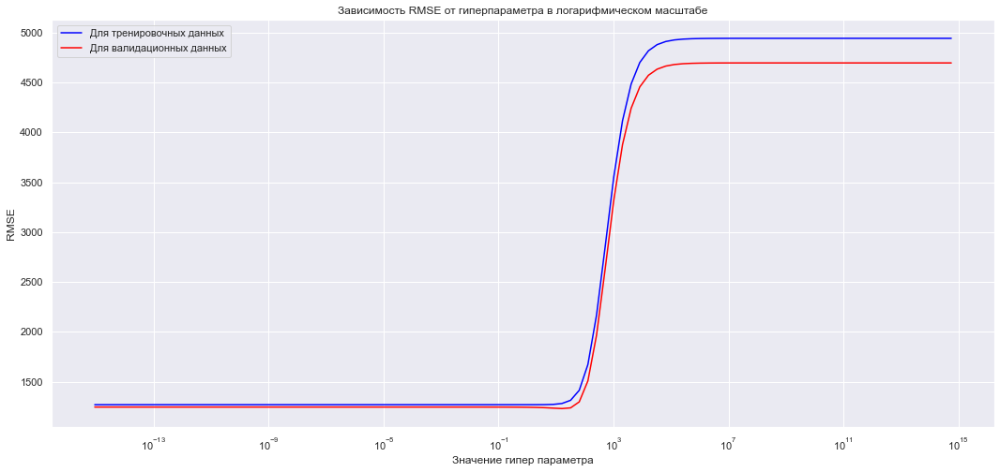

In [182]:
sns.set(style="darkgrid")
fig, ax = plt.subplots(figsize=(18, 8))
plt.xscale('log')
ax.plot(lambd1, RMSE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, RMSE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость RMSE от гиперпараметра в логарифмическом масштабе')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("RMSE")
plt.show()

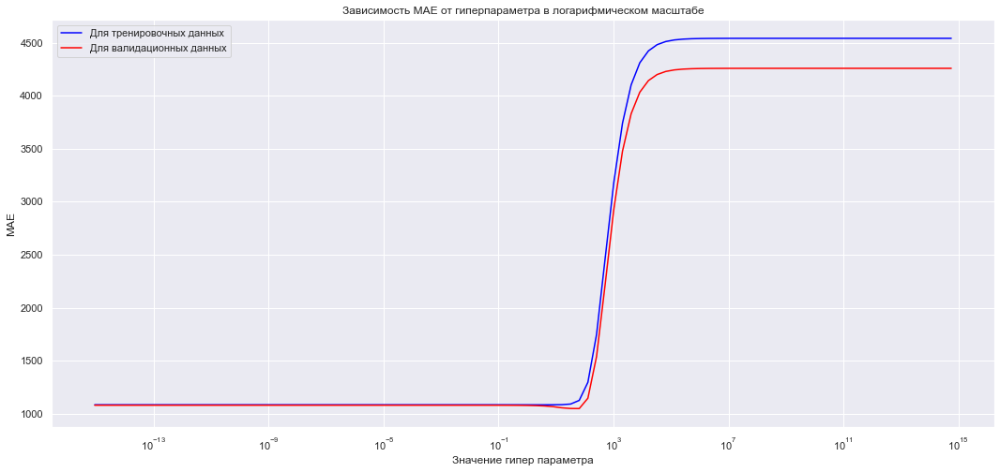

In [183]:
fig, ax = plt.subplots(figsize=(18, 8))
plt.xscale('log')
ax.plot(lambd1, MAE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAE от гиперпараметра в логарифмическом масштабе')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAE")
plt.show()

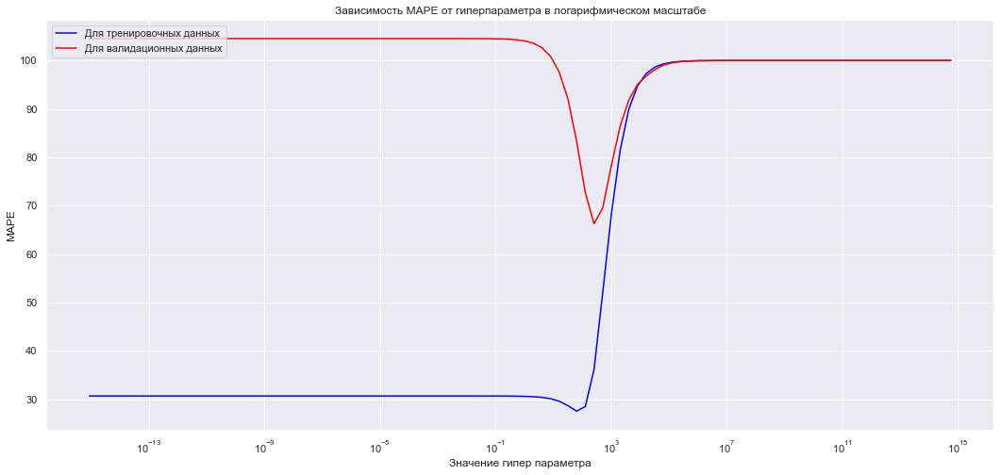

In [184]:
fig, ax = plt.subplots(figsize=(18, 8))
plt.xscale('log')
ax.plot(lambd1, MAPE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAPE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAPE от гиперпараметра в логарифмическом масштабе')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAPE")
plt.show()

Видно что метрика MAPE  показала себя очень странно. Так же заметно что у всех метрик в раене сотни был минимум. Давайте более подробно рассмотрим эту область после исследования зависимости параметров от $\lambda$.

Постройте также на одном графике кривые зависимости значений оценок коэффициентов от значений гиперпараметра. Какая наблюдается зависимость? Как вы это можете охарактеризовать?

*Замечание*. Для наглядности можно попробовать рисовать одним цветом все кривые, которые относятся к одному *исходному* признаку.

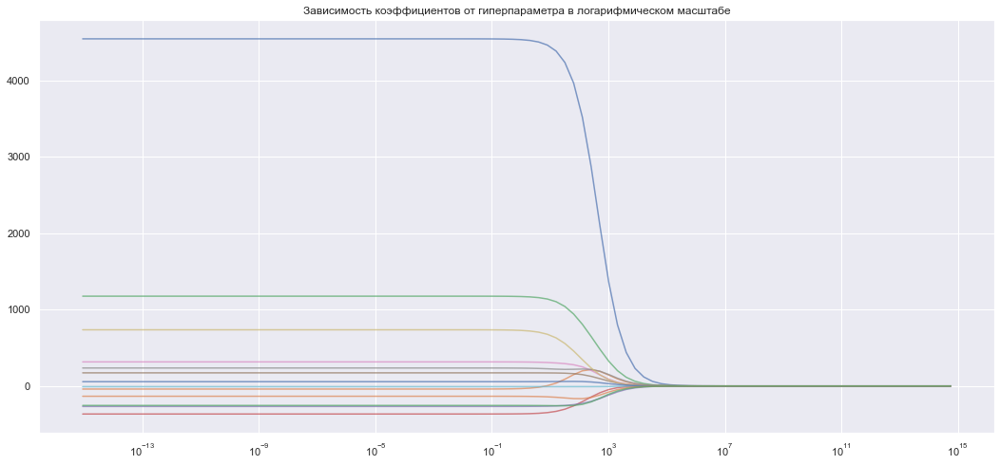

In [185]:
fig, ax = plt.subplots(figsize=(18, 8))
model_params_ = np.array(model_params).T
ax.set_title('Зависимость коэффициентов от гиперпараметра в логарифмическом масштабе')
for i in model_params_:
    ax.plot(lambd1, i, alpha = 0.7)
plt.xscale('log')
plt.show()

При $\lambda < 10^{-1}$ все параметры равны константе и изменяються слабо. Это легко объясняеться тем что это просто МНК. При очень больших $\lambda$ все параметры уходят в ноль. Это тоже вполне логично

Исследуем интересующий нас участок где параметры еще не нули но уже не МНК.

In [186]:
lambd1 = [i for i in range(0, 100, 1)]
RMSE_train = []
RMSE_valid = []
MAE_train = []
MAE_valid = []
MAPE_train = []
MAPE_valid = []
for i in lambd1:
    model = RidgeRegression(lambd=i)
    model.fit(X_train, train[target_feat])
    model_list+=[model]
    RMSE_train += [metrics.mean_squared_error(train[target_feat], model.predict(X_train)) ** 0.5]
    RMSE_valid += [metrics.mean_squared_error(valid[target_feat], model.predict(X_valid)) ** 0.5]
    MAE_train += [metrics.mean_absolute_error(train[target_feat], model.predict(X_train))]
    MAE_valid += [metrics.mean_absolute_error(valid[target_feat], model.predict(X_valid))]
    MAPE_train += [mean_absolute_percentage_error(train[target_feat], model.predict(X_train))]
    MAPE_valid += [mean_absolute_percentage_error(valid[target_feat], model.predict(X_valid))]

И построим графики метрик уже в этом масштабе.

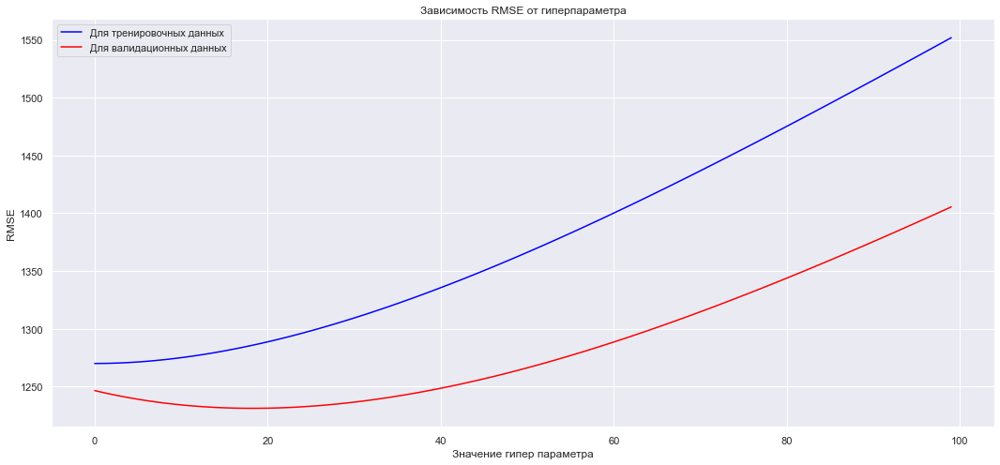

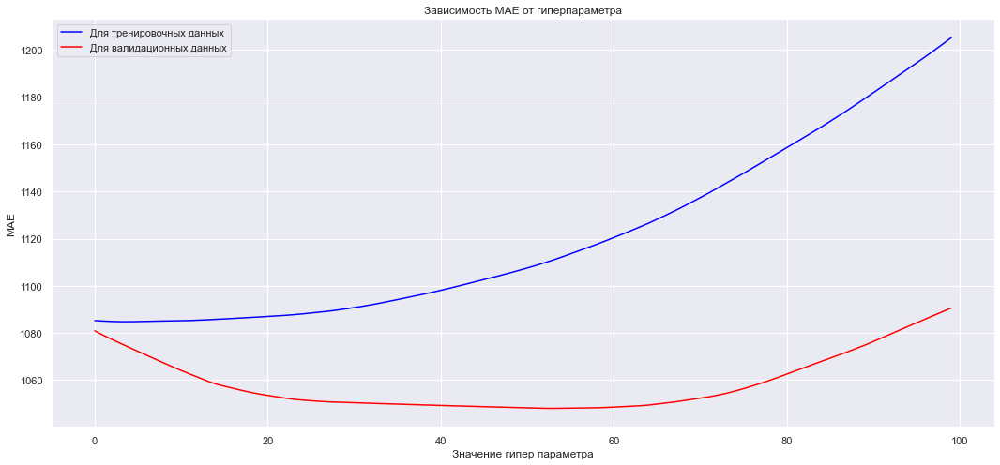

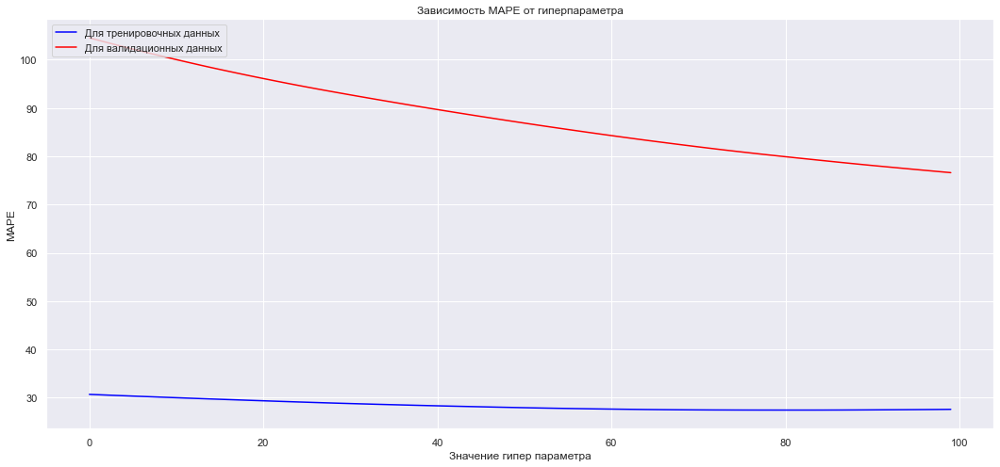

In [189]:
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, RMSE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, RMSE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость RMSE от гиперпараметра')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("RMSE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAE от гиперпараметра')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAPE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAPE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAPE от гиперпараметра')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAPE")
plt.show()

 Тут метрики разошлись. Ладно но все равно видно что при $\lambda = 25$ перве две метрики почти в минимуме.

Выберите оптимальное значение гиперпараметра и посчитайте ошибку на тестовой выборке.

Обработаем тестовый датафрейм

In [8]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
test_cat = encoder.fit_transform(test[categori_feat])
X_test = np.hstack([test[real_feat], test_cat])

Обучим модель при оптимальных $\lambda = 25$ И посмотрим на результат

In [263]:
model = RidgeRegression(lambd=25)
model.fit(X_train, train[target_feat])
RMSE_test = metrics.mean_squared_error(test[target_feat], model.predict(X_test)) ** 0.5
MAE_test = metrics.mean_absolute_error(test[target_feat], model.predict(X_test))
MAPE_test = mean_absolute_percentage_error(test[target_feat], model.predict(X_test))
print("Итого RMSE = ", RMSE_test, "MAE = ", MAE_test, "MAPE = ", MAPE_test)

Итого RMSE =  1391.8314714769465 MAE =  1181.0876324185615 MAPE =  30.805981308701092


Сделайте выводы.

Показатели по всем параметрам кроме MAPE ухудшились, но не сильно. По MAPE сильно улучшелись. Еще из исследования можно было понять что метрики не всегда согласованы.

### Задача 5.

Предположим, что имеющиеся у нас данные по велопрокату &mdash; большие данные. Конечно же в реальности это не так. Однако, для простой учебной задачи это в самый раз, чтобы ничего ни у кого не подвисало.

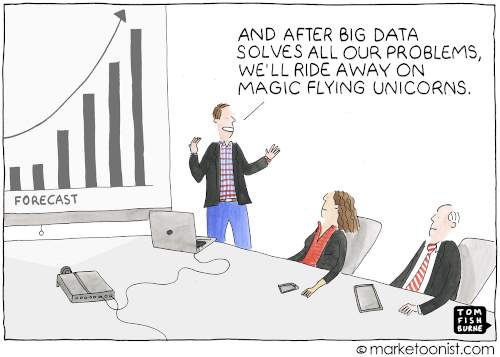

Выберите некоторое начальное приближение оценок коэффициентов, например, в начале координат.

Так как $\nabla F=  2\lambda\theta - 2X^TY + 2\cdot X^TX\theta$. Реализуем функцию градиента для более удобного дальнейшего кода.

In [190]:
def grad (X, Y, tetta):
    lambd = 25 # Воспользуемся результатами предыдущего ноутбука
    return 2*lambd*tetta - 2*X.T@Y + 2*X.T@X@tetta

Реализуйте процедуру mini-batch стохастического градиентного спуска для поиска оценок коэффициентов в модели ridge-регрессии. Размер батча обычно берут кратно степени двойки, например, 128 или 256.

In [191]:
def step(X, Y, tetta, batch):
    return tetta - batch * grad(X, Y, tetta)

Реализуем модель, обучающуюся таким способом.

In [192]:
class RidgeRegression_grad:
    fit_intercept = True
    def __init__(self, lambd=0.1, fit_intercept=True): 
        self.lambd = lambd
        self.fit_intercept = fit_intercept
        
        
    def fit(self, X, Y):
        x_high, x_len = X.shape
        if (self.fit_intercept):
            X = np.concatenate((np.ones(x_high).reshape((x_high, 1)), X), axis=1)
            x_len += 1
        self.tetta = np.array(x_len * [0]).reshape(x_len, 1)
        self.X = X
        self.Y = np.array(Y).reshape(Y.size, 1)
    def step(self, i):
        self.tetta = step(self.X, self.Y, self.tetta, i)
    def coef_(self):
        return self.tetta
    def predict(self, X):
        x_high, x_len = X.shape
        if (self.fit_intercept):
            X = np.concatenate((np.ones(x_high).reshape((x_high, 1)), X), axis=1)
        return (X @ self.tetta).reshape(x_high)

Нарисуйте графики зависимости значений метрик RMSE, MAE, MAPE от номера итерации для обучающей и валидационной выборок. Сколько итераций пришлось совершить?

In [201]:
batch = [0.000001] * 10000
RMSE_train = []
RMSE_valid = []
MAE_train = []
MAE_valid = []
MAPE_train = []
MAPE_valid = []
model = RidgeRegression_grad()
model.fit(X_train, train[target_feat])
for i in batch:
    model.step(i)
    RMSE_train += [metrics.mean_squared_error(train[target_feat], model.predict(X_train)) ** 0.5]
    RMSE_valid += [metrics.mean_squared_error(valid[target_feat], model.predict(X_valid)) ** 0.5]
    MAE_train += [metrics.mean_absolute_error(train[target_feat], model.predict(X_train))]
    MAE_valid += [metrics.mean_absolute_error(valid[target_feat], model.predict(X_valid))]
    MAPE_train += [mean_absolute_percentage_error(train[target_feat], model.predict(X_train))]
    MAPE_valid += [mean_absolute_percentage_error(valid[target_feat], model.predict(X_valid))]

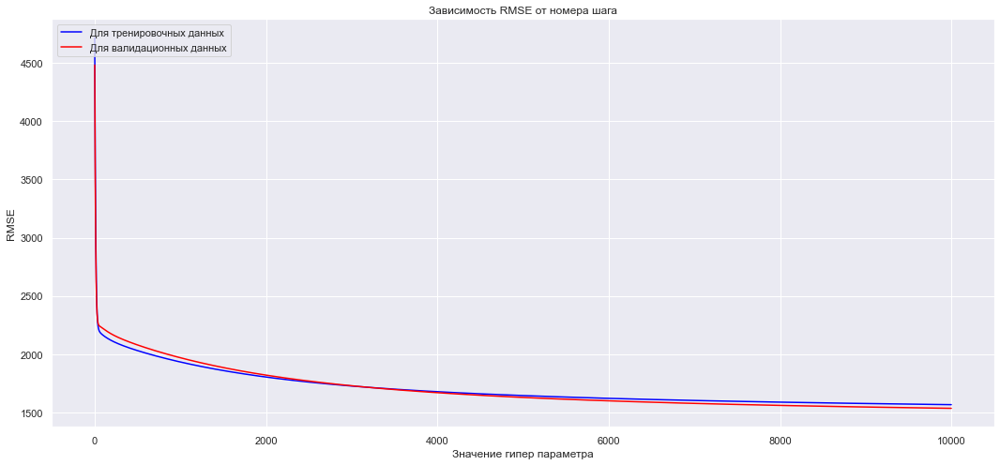

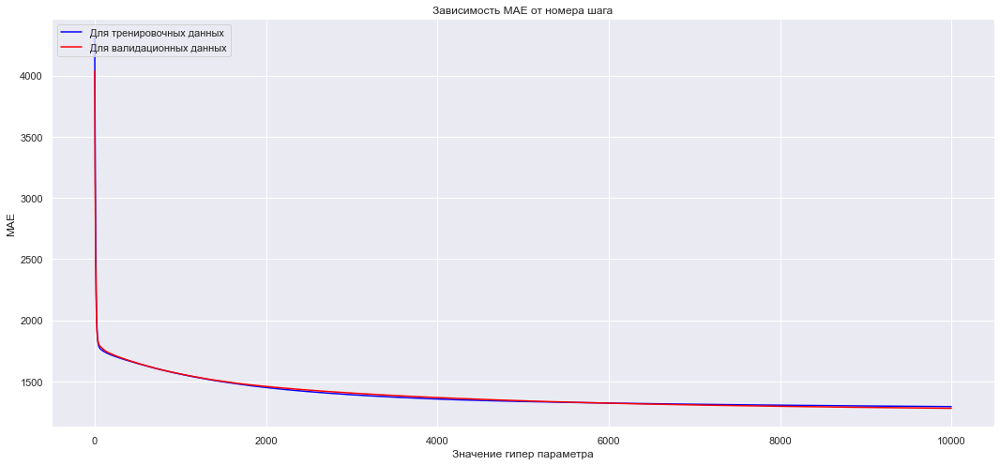

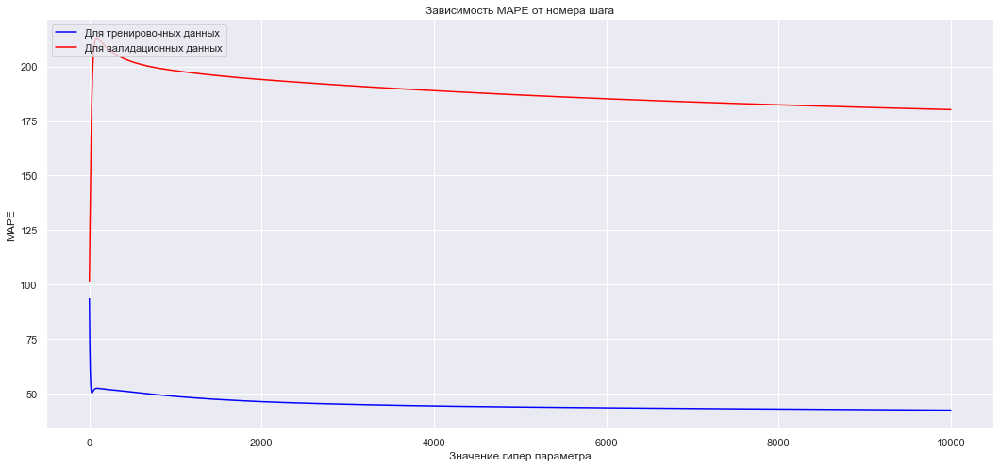

In [195]:
fig, ax = plt.subplots(figsize=(18, 8))
lambd1 = range(10000)
ax.plot(lambd1, RMSE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, RMSE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость RMSE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("RMSE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAPE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAPE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAPE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAPE")
plt.show()

По графикам видно что мы получаем достаточно точный результат после 4000 -й операции. Посмотрим после какого шага нам удасться получить стабильный результат для другого множителя градиента. Для $10^{-4}$

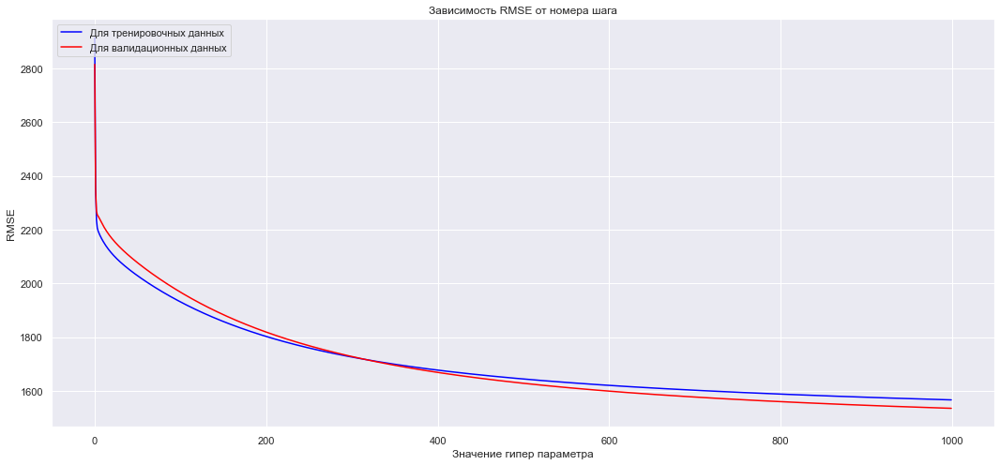

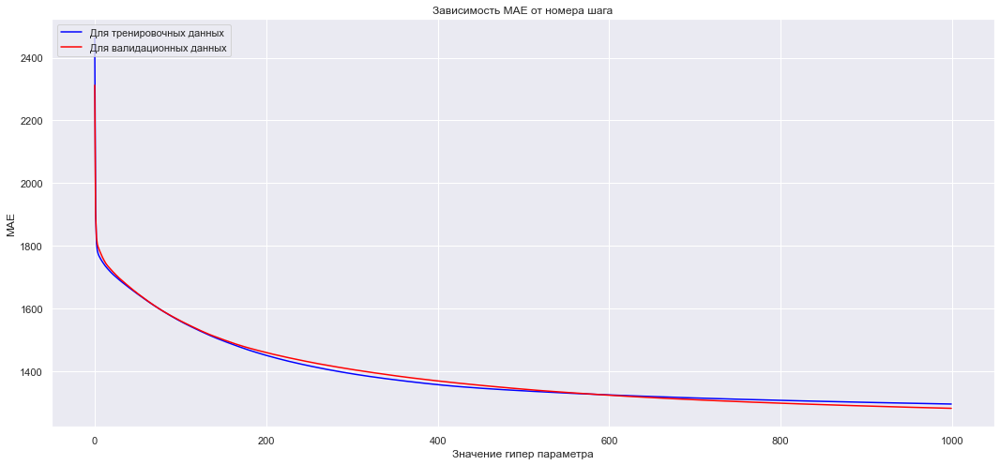

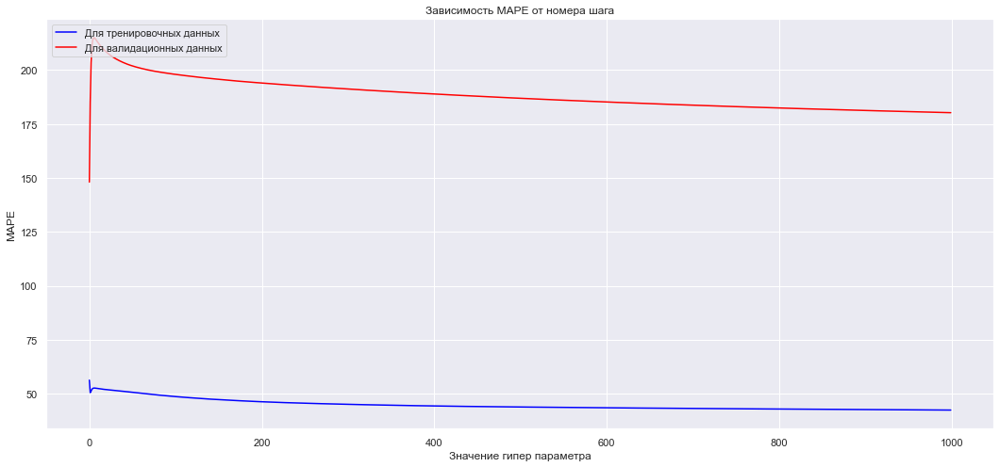

In [199]:
batch = [0.00001] * 1000
RMSE_train = []
RMSE_valid = []
MAE_train = []
MAE_valid = []
MAPE_train = []
MAPE_valid = []
model = RidgeRegression_grad()
model.fit(X_train, train[target_feat])
for i in batch:
    model.step(i)
    RMSE_train += [metrics.mean_squared_error(train[target_feat], model.predict(X_train)) ** 0.5]
    RMSE_valid += [metrics.mean_squared_error(valid[target_feat], model.predict(X_valid)) ** 0.5]
    MAE_train += [metrics.mean_absolute_error(train[target_feat], model.predict(X_train))]
    MAE_valid += [metrics.mean_absolute_error(valid[target_feat], model.predict(X_valid))]
    MAPE_train += [mean_absolute_percentage_error(train[target_feat], model.predict(X_train))]
    MAPE_valid += [mean_absolute_percentage_error(valid[target_feat], model.predict(X_valid))]
fig, ax = plt.subplots(figsize=(18, 8))
lambd1 = range(1000)
ax.plot(lambd1, RMSE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, RMSE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость RMSE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("RMSE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAPE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAPE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAPE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAPE")
plt.show()

Видно что после 600 - го  шага все бурное падение закончилось. По метрикам результаты отличаються не сильно.

Посмотрим для множителя $10^{-3}$

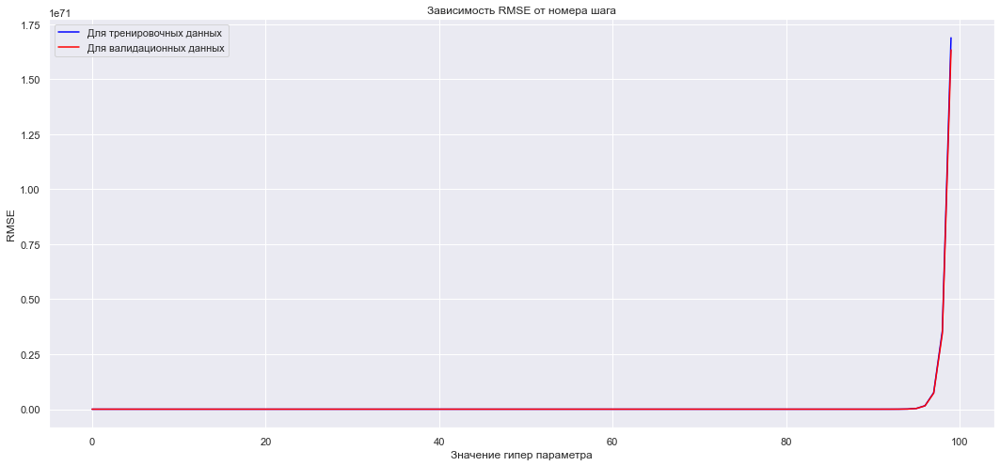

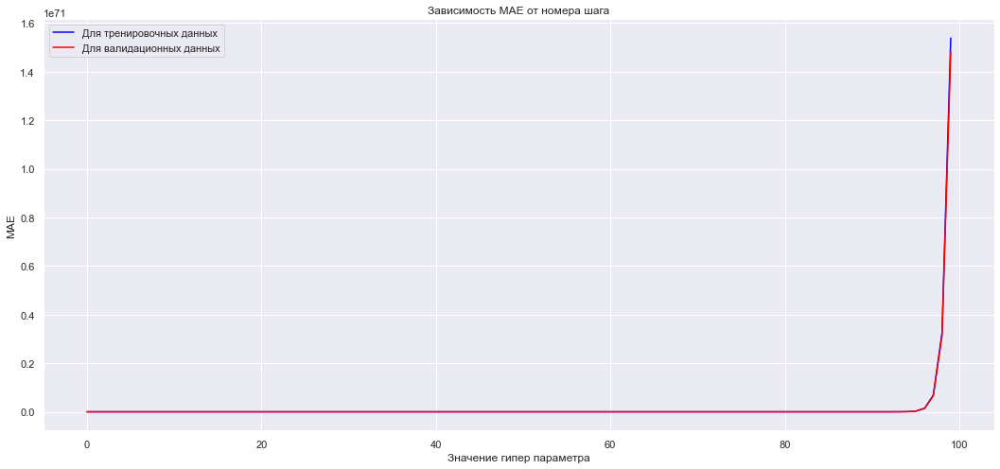

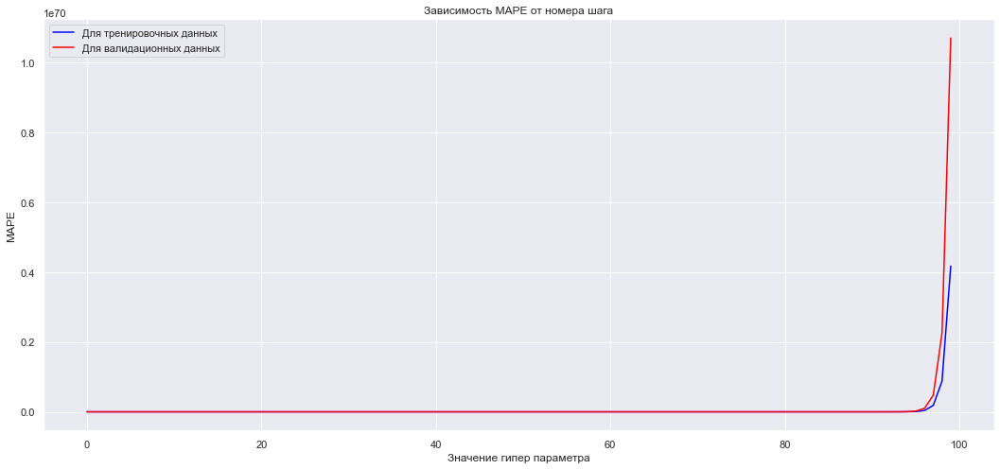

In [200]:
batch = [0.0001] * 100
RMSE_train = []
RMSE_valid = []
MAE_train = []
MAE_valid = []
MAPE_train = []
MAPE_valid = []
model = RidgeRegression_grad()
model.fit(X_train, train[target_feat])
for i in batch:
    model.step(i)
    RMSE_train += [metrics.mean_squared_error(train[target_feat], model.predict(X_train)) ** 0.5]
    RMSE_valid += [metrics.mean_squared_error(valid[target_feat], model.predict(X_valid)) ** 0.5]
    MAE_train += [metrics.mean_absolute_error(train[target_feat], model.predict(X_train))]
    MAE_valid += [metrics.mean_absolute_error(valid[target_feat], model.predict(X_valid))]
    MAPE_train += [mean_absolute_percentage_error(train[target_feat], model.predict(X_train))]
    MAPE_valid += [mean_absolute_percentage_error(valid[target_feat], model.predict(X_valid))]
fig, ax = plt.subplots(figsize=(18, 8))
lambd1 = range(100)
ax.plot(lambd1, RMSE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, RMSE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость RMSE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("RMSE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAE")
plt.show()
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(lambd1, MAPE_train, color="blue", label="Для тренировочных данных")
ax.plot(lambd1, MAPE_valid, color="red", label="Для валидационных данных")
ax.set_title('Зависимость MAPE от номера шага')
ax.legend(loc="upper left")
ax.set_xlabel('Значение гипер параметра')
ax.set_ylabel("MAPE")
plt.show()

Видно что метрики разошлись. Значит $10^{-3}$ слишком грубый спуск.

Посчитайте ошибку на тестовой выборке.

Моделью построенной с помощью большого количества шагов построим предсказание для тестовой выборки

In [202]:
RMSE_test = metrics.mean_squared_error(test[target_feat], model.predict(X_test)) ** 0.5
MAE_test = metrics.mean_absolute_error(test[target_feat], model.predict(X_test))
MAPE_test = mean_absolute_percentage_error(test[target_feat], model.predict(X_test))
print("Итого RMSE = ", RMSE_test, "MAE = ", MAE_test, "MAPE = ", MAPE_test)

Итого RMSE =  1685.7438321240247 MAE =  1394.934977751905 MAPE =  44.83263156676179


Сделайте выводы.

Чуть хуже чем точный метод но все еще не плохо.

Выводы : Если множитель градиента выбрать не достаточно маленьким метрики улетят в космос. Если не достаточно большим мы потеряем в производительности не поимев в качестве.